In [1]:
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
import sys
sys.path.append("..")
from mibi.preprocess.mibi_image import *
from mibi.preprocess.mibi_plot import *

In [3]:
data_dir = '/Users/mschachter/data/CHOP_TMA_pilot'
images_dir = os.path.join(data_dir, 'extracted')
channels_data_path = os.path.join(data_dir, 'info', 'channels.csv')

points_to_take = range(3, 12)

mp_images = dict()
for pdir in glob.glob(os.path.join(images_dir, 'Point*')):
    _,pname = os.path.split(pdir)
    point_index = int(pname[5:])
    if point_index in points_to_take:
        print(f"Loading from {pdir}")
        mp_images[pname] = MIBIMultiplexImage.load_from_path(os.path.join(pdir, 'TIFs'), channels_data_path)


Loading from /Users/mschachter/data/CHOP_TMA_pilot/extracted/Point4
Loading from /Users/mschachter/data/CHOP_TMA_pilot/extracted/Point3
Loading from /Users/mschachter/data/CHOP_TMA_pilot/extracted/Point5
Loading from /Users/mschachter/data/CHOP_TMA_pilot/extracted/Point11
Loading from /Users/mschachter/data/CHOP_TMA_pilot/extracted/Point10
Loading from /Users/mschachter/data/CHOP_TMA_pilot/extracted/Point7
Loading from /Users/mschachter/data/CHOP_TMA_pilot/extracted/Point9
Loading from /Users/mschachter/data/CHOP_TMA_pilot/extracted/Point8
Loading from /Users/mschachter/data/CHOP_TMA_pilot/extracted/Point6


In [4]:
for mp_name,mp_img in mp_images.items():
    mp_img.bg_subtract()

(256, 256)

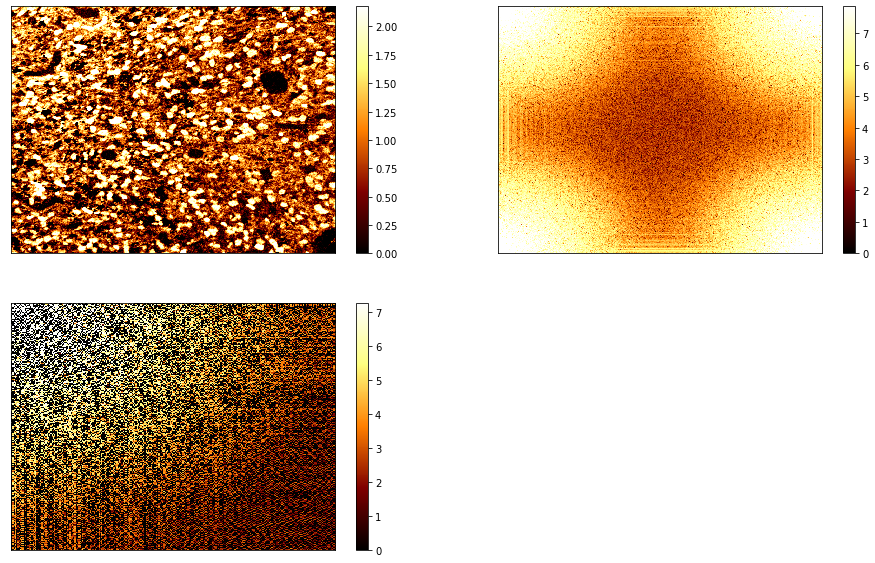

In [5]:
from scipy.fftpack import fft2, ifft2, dctn
point_name = 'Point9'
mp_img = mp_images[point_name]
chan_idx = mp_img.label_to_index['H3K27M']
img = mp_img.X['bgsub'][chan_idx]


img_fft = fft2(img)
img_dct = dctn(img, type=1, shape=(256, 256))

fig = plt.figure(figsize=(16, 10))
nrows = 2
ncols = 2

ax = plt.subplot(nrows, ncols, 1)
plot_img(img)

ax = plt.subplot(nrows, ncols, 2)
plot_img(np.abs(img_fft))

ax = plt.subplot(nrows, ncols, 3)
plot_img(img_dct)
img_dct.shape

In [6]:
df_stats = list()
for mp_name,mp_img in mp_images.items():
    df = mp_img.stats(transform='bgsub')
    df['fov'] = mp_name
    df_stats.append(df)
df_stats = pd.concat(df_stats)
col_order = ['channel_index', 'fov', 'channel_label', 'sparsity']
other_cols = sorted([c for c in df_stats.columns if c not in col_order])
col_order.extend(other_cols)
df_stats = df_stats[col_order]
df_stats.index = np.arange(len(df_stats))
df_stats.head()

,channel_index,fov,channel_label,sparsity,grad_p1,grad_p10,grad_p25,grad_p50,grad_p75,grad_p90,grad_p99,intensity_p1,intensity_p10,intensity_p25,intensity_p50,intensity_p75,intensity_p90,intensity_p99
0,7,Point4,nuclear,0.008111,2.810878e-05,0.000290,0.000749,0.001763,0.005079,0.037803,0.135164,0.080868,0.296842,0.506932,0.940721,2.567790,28.240313,59.760472
1,8,Point4,B7H3,0.141139,2.447591e-05,0.001599,0.008472,0.030036,0.065664,0.102039,0.183621,0.000028,0.001440,0.013046,0.057273,0.118395,0.215877,0.476825
2,9,Point4,EGFR,0.076596,1.118712e-04,0.003796,0.016111,0.043766,0.085118,0.126448,0.201902,0.000061,0.002184,0.014872,0.059814,0.122411,0.202228,0.379428
3,10,Point4,IL13RA2,0.382668,1.024236e-04,0.003216,0.013557,0.041325,0.087123,0.132689,0.216361,0.000352,0.006211,0.020403,0.061857,0.116555,0.183634,0.335921
4,11,Point4,NeuN,0.313281,6.986806e-07,0.000153,0.002111,0.021961,0.060494,0.090524,0.179232,0.000007,0.000463,0.002786,0.022043,0.096696,0.182864,0.449156


In [7]:
# prepare the data matrix
x_cols = [c for c in df_stats.columns if c.startswith('intensity')] #c not in ['channel_index', 'channel_label', 'fov'] and not c.startswith('intensity_')]
X = df_stats[x_cols].values
Xz = X - X.mean(axis=0)
Xz = Xz / X.std(axis=0, ddof=1)

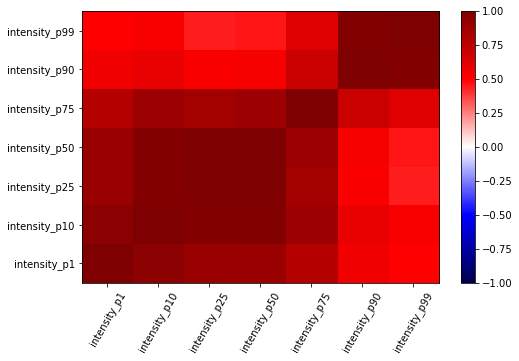

In [8]:
C = np.corrcoef(Xz.T)

fig = plt.figure(figsize=(8, 5))
ax = plt.subplot(1, 1, 1)
plt.imshow(C, interpolation='nearest', aspect='auto', origin='lower',
           vmin=-1, vmax=1, cmap=plt.cm.seismic)
plt.yticks(np.arange(len(x_cols)), x_cols)
plt.xticks(np.arange(len(x_cols)), x_cols, rotation=60)
plt.colorbar()
plt.autoscale(tight=True)

In [9]:
from sklearn.decomposition import PCA

pca = PCA(n_components=3)
Xpca = pca.fit_transform(Xz)
Xpca.shape

(126, 3)

In [10]:
pca.explained_variance_ratio_

array([0.78212748, 0.17231675, 0.02866429])

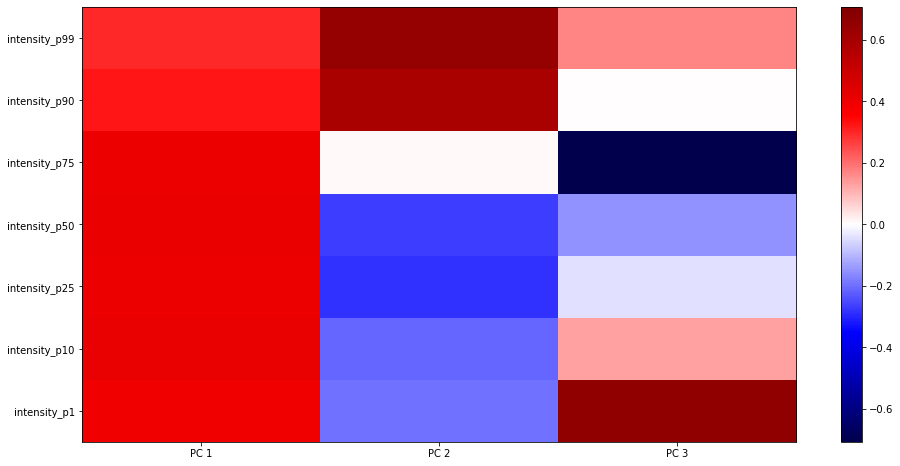

In [11]:
fig = plt.figure(figsize=(16, 8))

absmax = np.abs(pca.components_).max()
ax = plt.subplot(1, 1, 1)
plt.imshow(pca.components_.T, cmap=plt.cm.seismic, interpolation='nearest', aspect='auto',
           vmin=-absmax, vmax=absmax, origin='lower')
plt.yticks(np.arange(len(x_cols)), x_cols)
y = np.arange(pca.components_.shape[0])
plt.xticks(y, [f"PC {int(v)+1}" for v in y])
plt.colorbar();

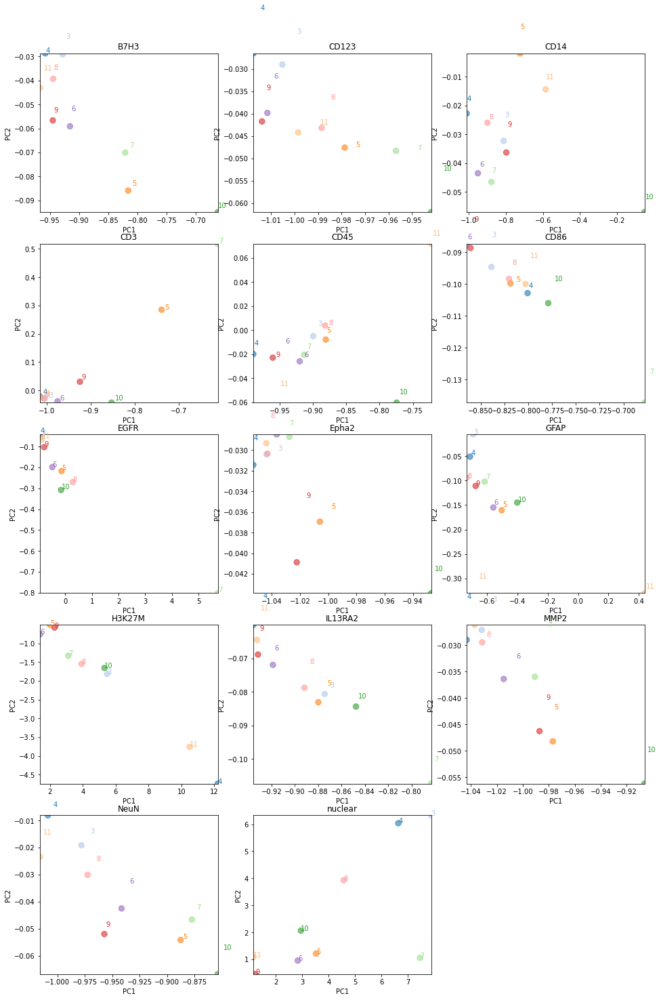

In [12]:
nrows = 5
ncols = 3
fig = plt.figure(figsize=(16, nrows*5))

cmap = plt.cm.tab20
fov_names = df_stats['fov'].unique()
fov_nums = [fov[5:] for fov in fov_names]
fov_idx = np.arange(len(fov_names))
np.random.shuffle(fov_idx)
fov_colors = {fov_names[j]:cmap(j) for j in fov_idx}

pcs = [0, 1]

for k,(chan,gdf) in enumerate(df_stats.groupby('channel_label')):
    
    i = gdf.index
    Xproj = Xpca[i, :]
    Xproj = Xproj[:, pcs]
    
    clrs = [fov_colors[fov] for fov in gdf['fov']]
    
    ax = plt.subplot(nrows, ncols, k+1)
    plt.scatter(Xproj[:, 0], Xproj[:, 1], alpha=0.6, color=clrs, s=70)
    plt.xlabel(f"PC{pcs[0]+1}")
    plt.ylabel(f"PC{pcs[1]+1}")
    
    for j,fov in enumerate(gdf['fov']):
        x,y = Xproj[j, :]
        fov_num = fov[5:]
        xjitter = np.random.rand()*0.01
        yjitter = np.random.rand()*0.01
        plt.text(x+xjitter, y+yjitter, fov_num, color=clrs[j])

    plt.title(chan)
    plt.autoscale(tight=True)

# Scanpy

In [13]:
# create the annotation data frames
dummy_col = np.zeros(len(x_cols))
vars_df = pd.DataFrame({'dummy':dummy_col}, index=x_cols)

chan_name = df_stats['fov'] + "_" + df_stats['channel_label']
obs_df = pd.DataFrame({'fov':df_stats['fov'].values,
                       'channel':df_stats['channel_label'].values},
                      index=chan_name.values)

In [14]:
# create the scanpy object
import scanpy as sc
import anndata
adata = anndata.AnnData(Xz, obs_df, vars_df)

In [15]:
sc.tl.pca(adata, n_comps=3)

/Users/mschachter/opt/anaconda3/envs/mibi_processing/lib/python3.7/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'fov' as categorical
/Users/mschachter/opt/anaconda3/envs/mibi_processing/lib/python3.7/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'channel' as categorical


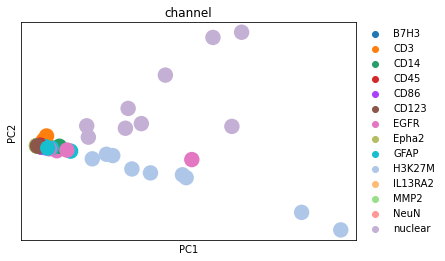

In [16]:
sc.pl.pca(adata, color='channel')

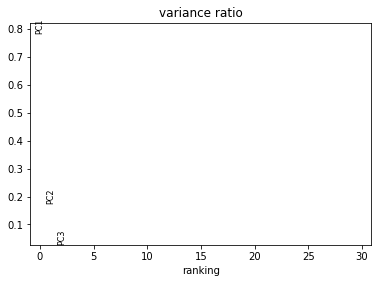

In [17]:
sc.pl.pca_variance_ratio(adata)

In [18]:
sc.pp.neighbors(adata, n_neighbors=10)

In [19]:
sc.tl.umap(adata)

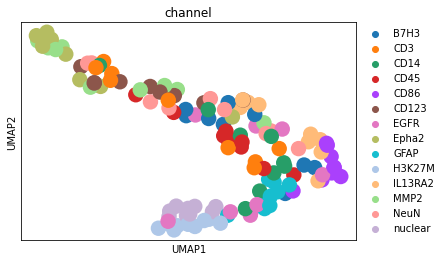

In [20]:
sc.pl.umap(adata, color=['channel'])

# Hit/Miss Plots

In [35]:
def hit_miss_plot(chan_name, hit_points, ncols=4, transform='bgsub', miss_points=None):
    
    if miss_points is None:
        all_miss_points = [x for x in mp_images.keys() if x not in hit_points]
        np.random.shuffle(all_miss_points)
        miss_points = all_miss_points[:4]
    
    def transform_img(img, norm_percentile=99, thresh=0):
        cimg = img.copy()
        cimg[cimg < thresh] = 0.
        timg = np.arcsinh(cimg)
        p_norm = np.percentile(timg.ravel(), norm_percentile)
        if np.isnan(p_norm):
            p_norm = timg.max()
        timg /= p_norm
        timg[timg > 1] = 1
        return timg
    
    def make_merged_image(mp_img):
        gold_idx = mp_img.label_to_index['197_Au']
        nuclear_idx = mp_img.label_to_index['nuclear']
        chan_idx = mp_img.label_to_index[chan_name]
        
        gold_img = mp_img.X['raw'][gold_idx]
        nuclear_img = mp_img.X[transform][nuclear_idx]
        chan_img = mp_img.X[transform][chan_idx]
        
        img_shape = gold_img.shape
        final_img = np.zeros([img_shape[0], img_shape[1], 3])
        
        gold_img = transform_img(gold_img, norm_percentile=100)
        
        nuclear_img = transform_img(nuclear_img, norm_percentile=100)
        nuclear_img *= 0.5
        
        chan_img = transform_img(chan_img, norm_percentile=99, thresh=0.0)
        
        final_img[:, :, 0] = chan_img
        final_img[:, :, 1] = nuclear_img
        final_img[:, :, 2] = gold_img
        
        return final_img
    
    nrows = 2
    fig = plt.figure(figsize=(ncols*5, 10))
    
    gspec = fig.add_gridspec(ncols=ncols, nrows=nrows)
    
    def plot_img(mp_img, ax):
        final_img = make_merged_image(mp_img)
        plt.imshow(final_img, interpolation='nearest', aspect='auto')
        ax.axes.xaxis.set_visible(False)
        ax.axes.yaxis.set_visible(False)
        plt.title(f"{chan_name}: {p}")
        plt.autoscale(tight=True)
        
    for k,p in enumerate(hit_points):        
        mp_img = mp_images[p]
        ax = fig.add_subplot(gspec[0, k])
        plot_img(mp_img, ax)
        
    for k,p in enumerate(miss_points):
        mp_img = mp_images[p]
        ax = fig.add_subplot(gspec[1, k])
        plot_img(mp_img, ax)
        
    plt.tight_layout()


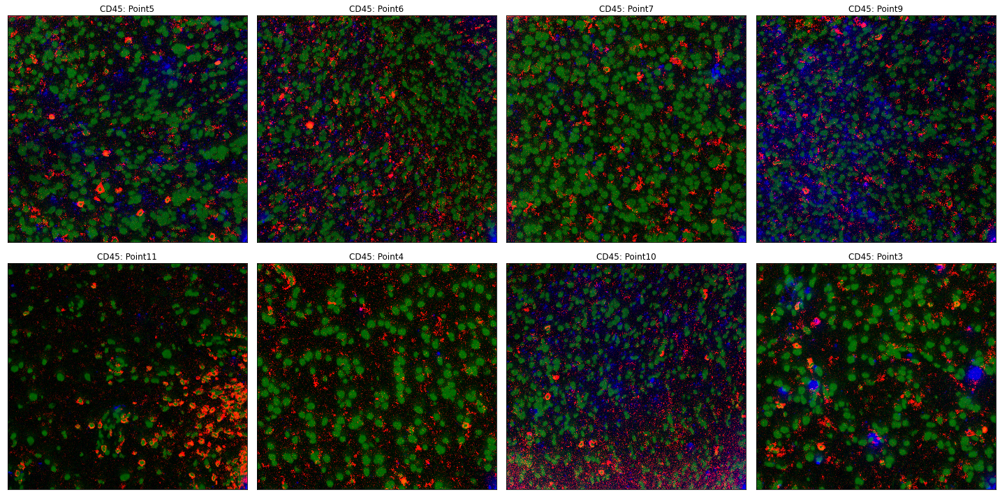

In [36]:
hit_miss_plot('CD45', hit_points=['Point5', 'Point6', 'Point7', 'Point9'])

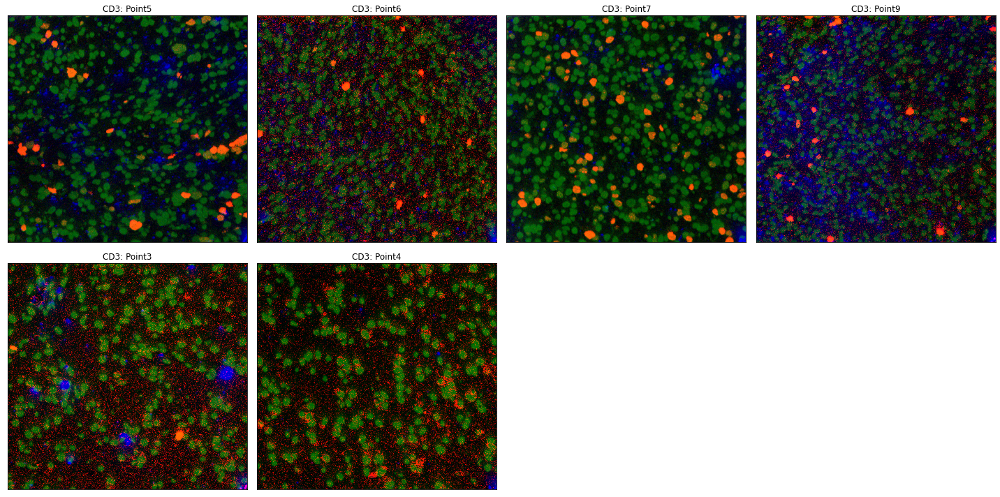

In [37]:
hit_miss_plot('CD3', hit_points=['Point5', 'Point6', 'Point7', 'Point9'], miss_points=['Point3', 'Point4'])

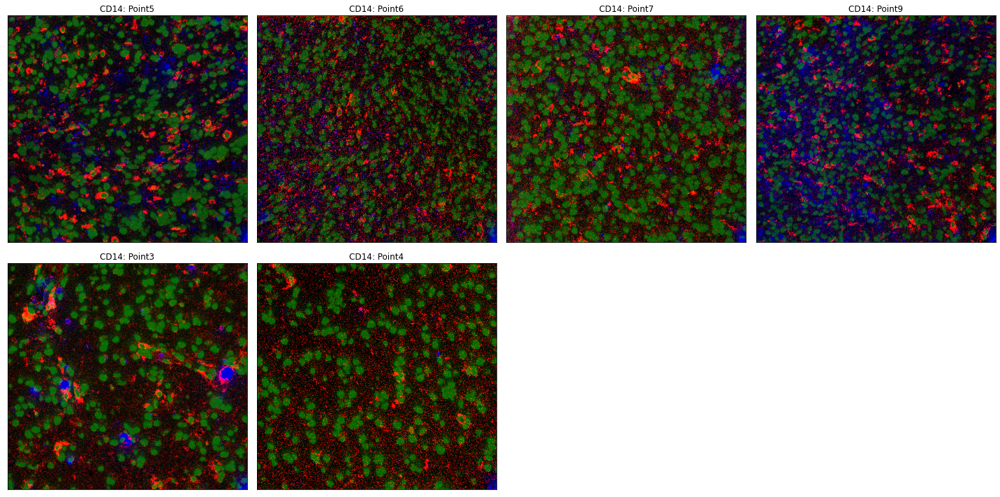

In [39]:
hit_miss_plot('CD14', hit_points=['Point5', 'Point6', 'Point7', 'Point9'], miss_points=['Point3', 'Point4'])

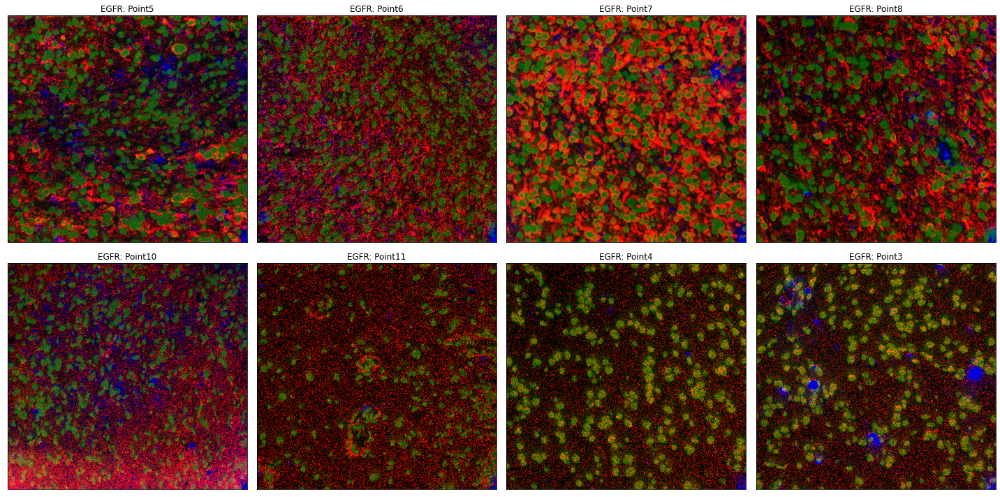

In [41]:
hit_miss_plot('EGFR', hit_points=['Point5', 'Point6', 'Point7', 'Point8'])

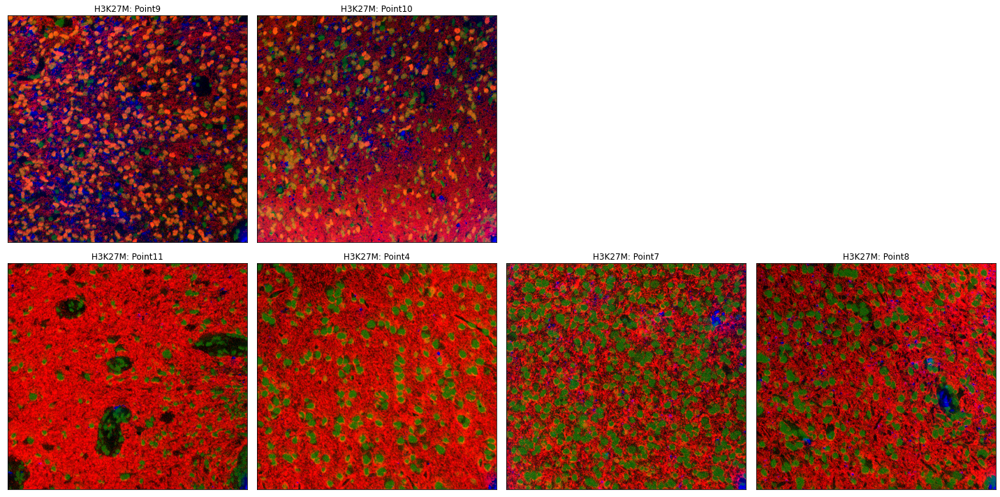

In [42]:
hit_miss_plot('H3K27M', hit_points=['Point9', 'Point10'])

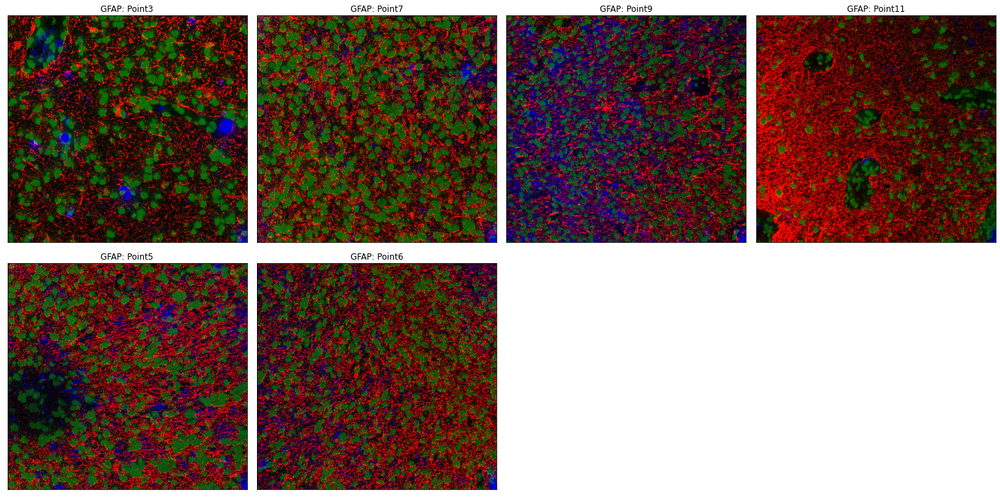

In [43]:
hit_miss_plot('GFAP', hit_points=['Point3', 'Point7', 'Point9', 'Point11'], miss_points=['Point5', 'Point6'])